In [1]:
import os 
os.chdir("/home/bennour/Projects/older project/housing_kaggle/")

In [2]:
import pandas as pd 
import numpy as np 
import statsmodels as sm
import sklearn as sk 

In [3]:
df = pd.read_csv("train.csv")
dft = pd.read_csv("test.csv")

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1460 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            1460 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non

In [4]:
def elnullo(x):
    for i in x.columns: 
        if x[i].dtypes == 'float64' : 
            x[i].replace(np.nan, 0, inplace=True)
        if x[i].dtypes == 'int64' : 
            x[i].replace(np.nan, 0, inplace=True)
        if x[i].dtypes == 'object':
            x[i].replace(np.nan, 'none', inplace=True)
    return x 

In [5]:
df_1 = elnullo(df)
df_2 = elnullo(dft)

In [42]:
import plotly.express as px 

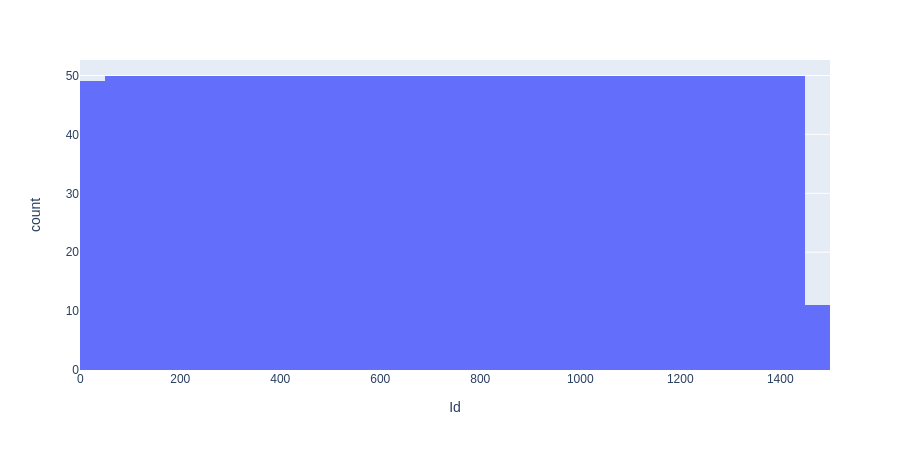

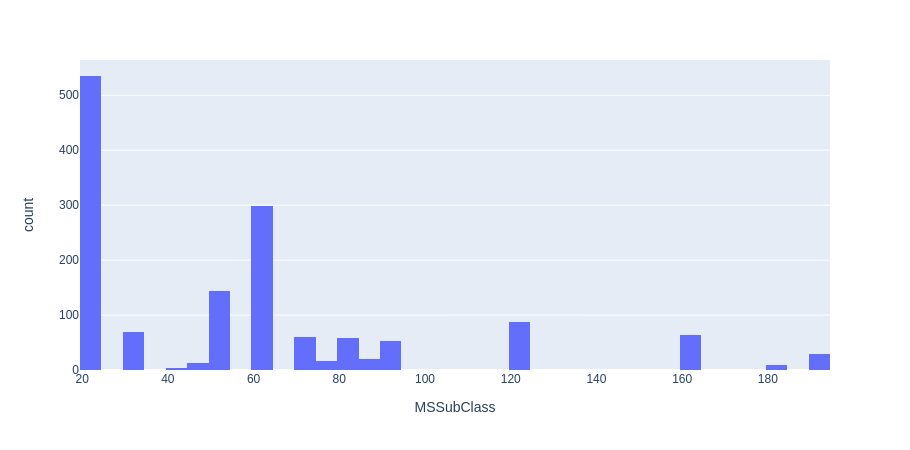

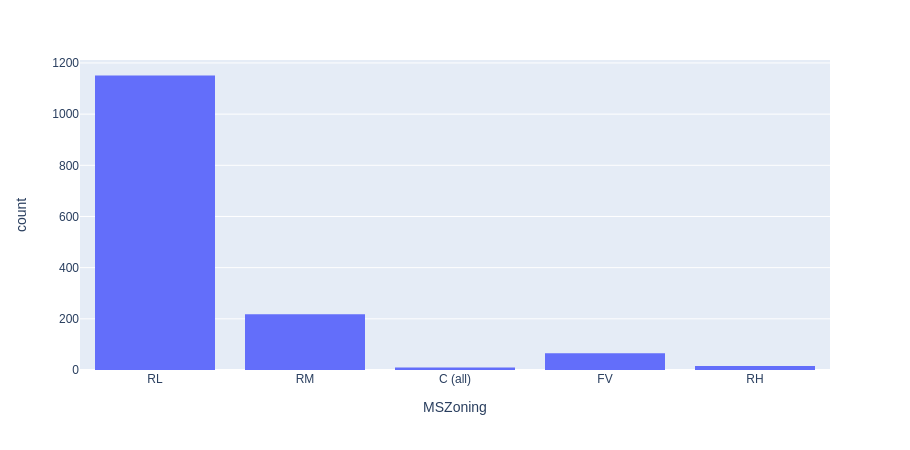

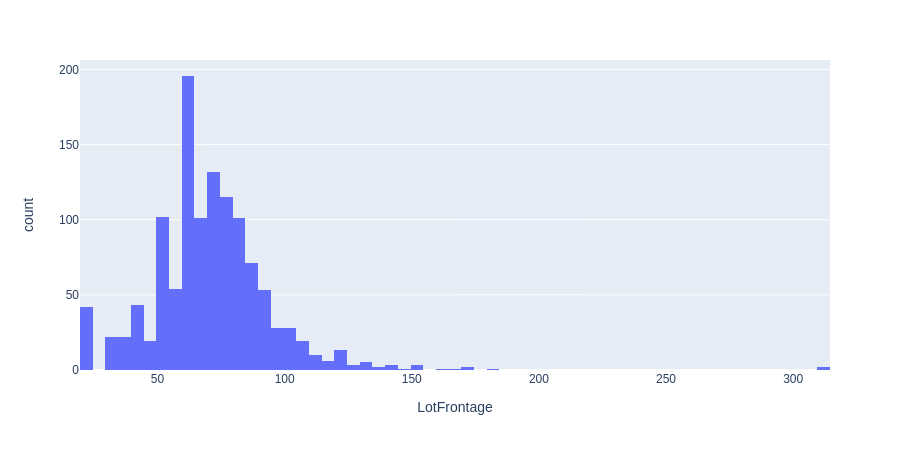

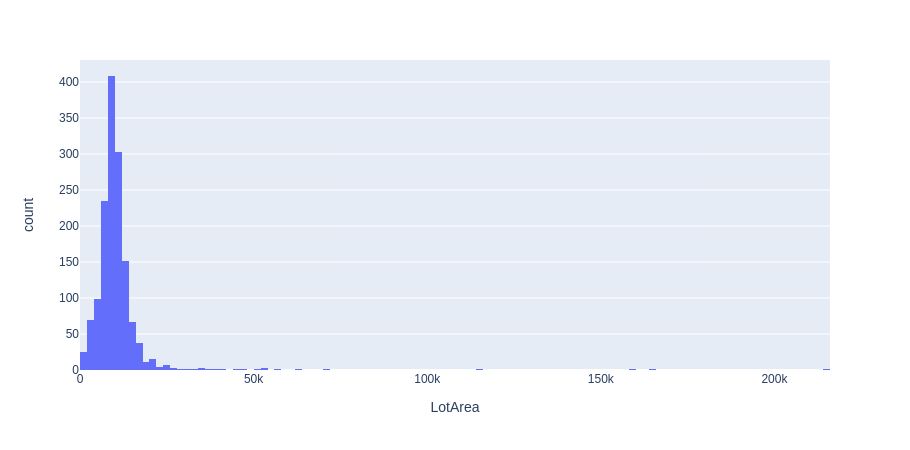

...

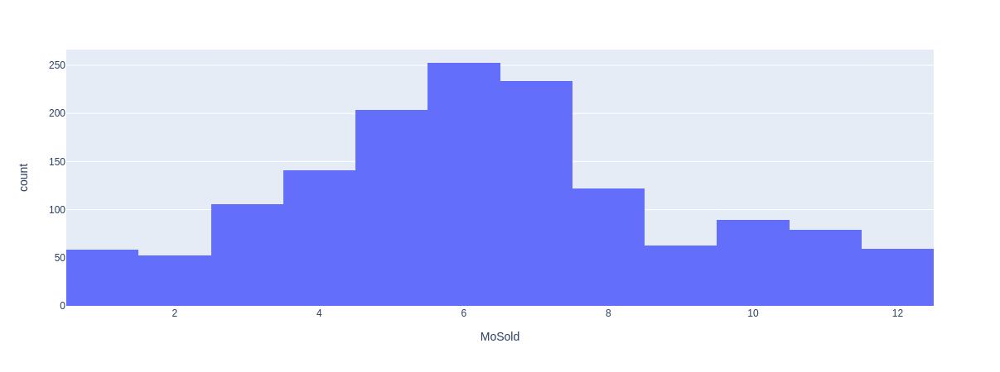

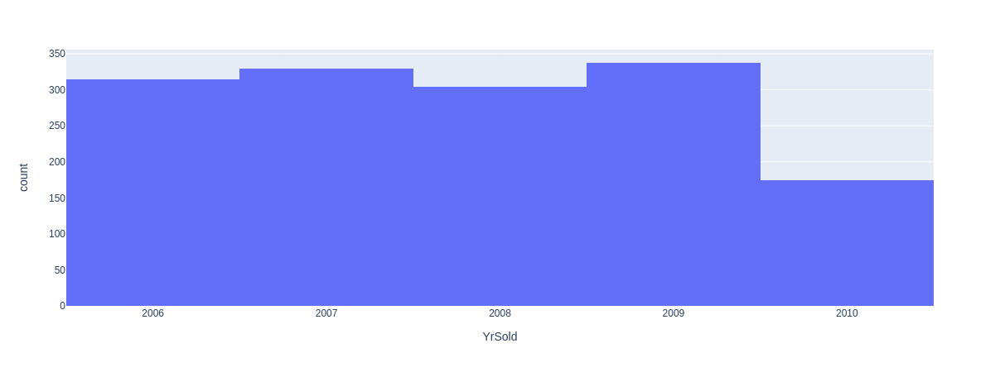

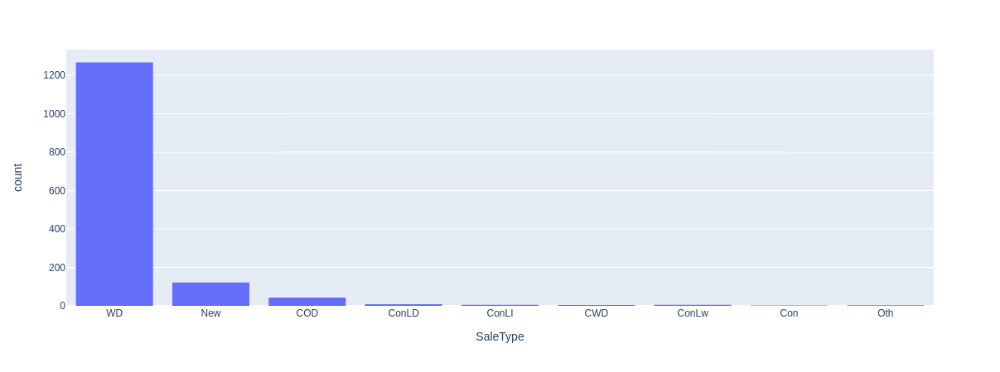

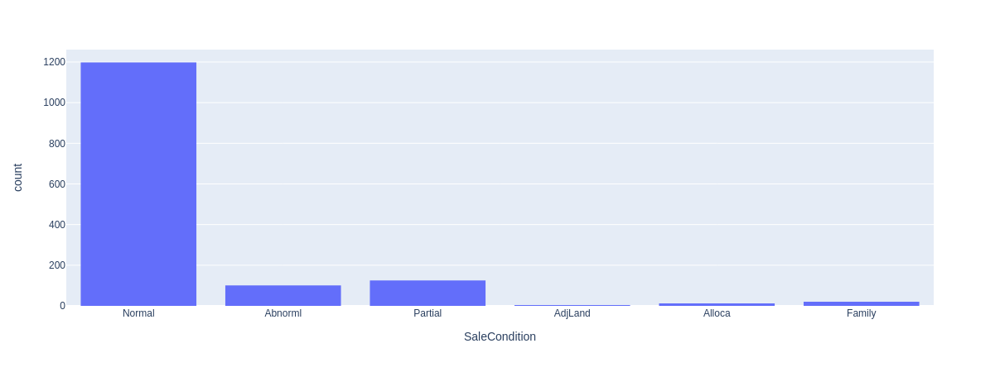

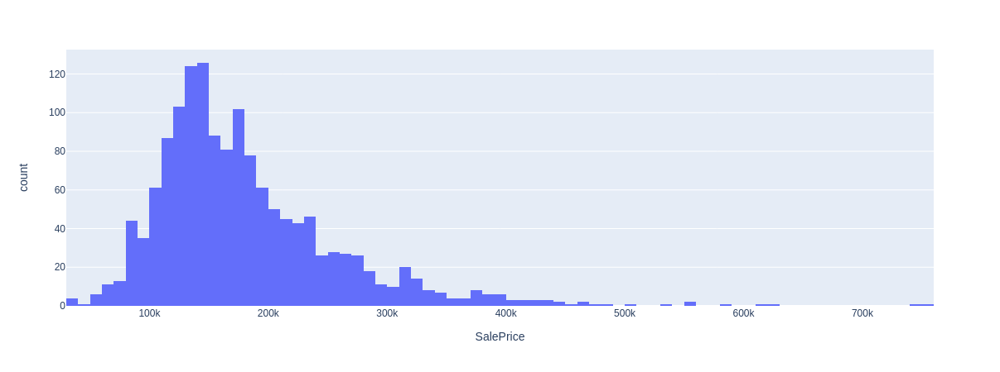

In [43]:
for i in df.columns :
    fig = px.histogram(df, x=df[i])
    fig.show()

In [6]:
df_1n = df_1.select_dtypes(['float64', 'int64'])
df_1c = pd.get_dummies(df_1.select_dtypes('object'))

In [7]:
from sklearn.preprocessing import normalize
dfn_scaled = pd.DataFrame(normalize(df_1n.iloc[:,1:]), columns = df_1n.columns[1:])

In [10]:
dft_1 = pd.concat([dfn_scaled, df_1c], axis = 1)
dft_1

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.000287,0.000311,0.040484,0.000034,0.000024,0.009596,0.009596,0.000939,0.003382,0.000000,...,0,0,0,1,0,0,0,0,1,0
1,0.000110,0.000440,0.052801,0.000033,0.000044,0.010868,0.010868,0.000000,0.005379,0.000000,...,0,0,0,1,0,0,0,0,1,0
2,0.000268,0.000304,0.050261,0.000031,0.000022,0.008940,0.008944,0.000724,0.002171,0.000000,...,0,0,0,1,0,0,0,0,1,0
3,0.000499,0.000427,0.068019,0.000050,0.000036,0.013639,0.014031,0.000000,0.001538,0.000000,...,0,0,0,1,1,0,0,0,0,0
4,0.000240,0.000335,0.056936,0.000032,0.000020,0.007985,0.007985,0.001397,0.002615,0.000000,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.000342,0.000354,0.045177,0.000034,0.000029,0.011407,0.011413,0.000000,0.000000,0.000000,...,0,0,0,1,0,0,0,0,1,0
1456,0.000095,0.000404,0.062595,0.000029,0.000029,0.009398,0.009445,0.000565,0.003753,0.000774,...,0,0,0,1,0,0,0,0,1,0
1457,0.000262,0.000247,0.033901,0.000026,0.000034,0.007277,0.007521,0.000000,0.001031,0.000000,...,0,0,0,1,0,0,0,0,1,0
1458,0.000140,0.000477,0.068176,0.000035,0.000042,0.013681,0.014004,0.000000,0.000344,0.007220,...,0,0,0,1,0,0,0,0,1,0


In [15]:
Y = dft_1['SalePrice']
X = dft_1.drop('SalePrice', axis = 1)

In [20]:
from sklearn.model_selection import train_test_split

Xtrain, Xtest, Ytrain, Ytest = train_test_split(X,Y, test_size = 0.25, random_state= 0)

In [21]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators= 50, random_state=0)
model.fit(Xtrain, Ytrain)
y = model.predict(Xtest)

In [22]:
from sklearn import metrics 

print('mean absolute error' , metrics.mean_absolute_error(Ytest, y))
print('mean squared error' , metrics.mean_squared_error(Ytest, y))
print('mean root squared error' , np.sqrt(metrics.mean_squared_error(Ytest, y)))

mean absolute error 0.0002986541730621166
mean squared error 1.4974475405490679e-06
mean root squared error 0.0012237023905137506
